# MPSTDP and the Heuristic Solution

In [1]:
# Author: Josephine s2346729
# Created: 2023-06-26
# Last Modified: 2023-07-11
# Version: 1.2 Add My solution 1, Add my solution 2

# import packages
import xpress as xp
import numpy as np
import pandas as pd
import timeit 
import matplotlib.pyplot as plt
import os

## 1. Read Data
In this section, we have scripted several functions, primarily focusing on processing all the data within the "Data" folder.

In [2]:
# Read all files' names, files are in 'Data' folder
def read_names(folder_path:str):
    '''
    file name start with 'Data_40_.' have sales person
    file name start with 'Data_50_.' do not have sales person
    '''
    file_names = []  

    # traverse all files in the folder
    for file_name in os.listdir(folder_path):
        # use os.path.join() to concatenate file paths
        file_name_path = os.path.join(folder_path, file_name)
    
        # checking if it is a file
        if os.path.isfile(file_name_path):
            file_names.append(file_name)
    
    return file_names

In [3]:
# read data from file as raw data
def read_data(file_path:str,start_marker:str,end_marker:str):
    '''
    This is a function to read lines in a file between start_marker and end_marker.
    Input: file path contain the file's name, start and end markers' characters.
    Output: a list of lines between start and end marker.
    '''
    with open(file_path,'r') as file:
        is_between_markers = False
        lines = []
        for line in file:
            line = line.strip()

            if line == start_marker:
                is_between_markers = True
                continue
        
            if line == end_marker:
                is_between_markers = False
                break
        
            if is_between_markers:
                lines.append(line)
        return lines

In [4]:
'''
We have 2 fucntions in this module.
The inputs are same.
The first function read_file return one file's Parameters part, BasicUnits part and SalesPersons part separately.
The second function return the same thing but meanwhile plot the location of each customer, labled with their numbers and visit rythems.
'''
# pre-process raw data
def read_file(file_path:str):
    '''
    This function is to read all data in a file and do some pre-process.
    Input: complete file path include the file's name.
    Output: Parameters in dictionary, BasicUnits in numpy array, SalesPersons in array
    '''    
    # ---  read parameters and preprocess it --- #
    Parameters = read_data(file_path ,'begin {Parameters}','end {Parameters}')
    
    # transfer raw data into dictionary type
    keys = Parameters[0::2]
    values = [int(value) for value in Parameters[1::2]]
    Parameters = {key: value for key, value in zip(keys, values)}

    # --- read basicunits --- #
    BasicUnits = read_data(file_path ,'begin {BasicUnits}','end {BasicUnits}')
    
    # transfer raw data into np.array
    my_string = '\n'.join(BasicUnits)
    my_split_list = my_string.split()
    BasicUnits = np.array(my_split_list,dtype = float).reshape(int(Parameters['Number of BasicUnits']), 6)
        
    
    # --- read SalesPersons --- #
    SalesPersons = read_data(file_path ,'begin {SalesPersons}','end {SalesPersons}')
    
    # transfer raw data's elements into int type
    if len(SalesPersons) > 0: 
        SalesPersons = list(map(int, SalesPersons[0].split()))
    
    return Parameters,BasicUnits,SalesPersons

In [5]:
def Geo_overview(file_path:str):
    '''
    This function use function read_file to read and preprocess all data and 
    draw a picture to show positions of customer and sales man, labeled with visiting frequenct.
    
    Input: complete file path include the file's name.
    Output: Parameters in dictionary, BasicUnits in numpy array, SalesPersons in array
    '''   

    Parameters,BasicUnits,SalesPersons = read_file(file_path)
    
    x = BasicUnits[:,1]
    y = BasicUnits[:,2]
    
    # highlight position(s) of sales-person
    if len(SalesPersons) > 0:
        for i in SalesPersons:
            highlight_index = i - 1
            highlight_x = x[highlight_index]
            highlight_y = y[highlight_index]
            plt.scatter(highlight_x, highlight_y, color='red', marker='*', s=200)

    # plot scatter
    plt.scatter(x, y, color = 'black')

    # add visit frequency as lables
    for i in range(len(x)):
        # plt.text(x[i], y[i], int(BasicUnits[i,4]), ha='left', va='bottom')
        plt.text(x[i], y[i], int(BasicUnits[i,0]), ha='right', va='bottom')

    # show plot
    plt.show()
    
    return Parameters,BasicUnits,SalesPersons

## Result Analysis
This is a preparatory module, primarily comprising functions that will be utilized for analysis after the model's solution is obtained.

In [6]:
def gap(value_heu,value_opt):
    '''
    This function is to claculate the gap between original optimal.
    '''
    return round((value_heu-value_opt)/value_opt*100,3)

In [7]:
# a function to show groups in a figure
def show_Groups(BasicUnits,Groups):
    '''
    See groups in figure: use in Week Cneters group
    '''
    # _,_,_ = Geo_overview('Data/'+'Data_50_8_3_1.txt')
    x = BasicUnits[:,1]
    y = BasicUnits[:,2]

    plt.scatter(x,y)
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'brown', 'pink']
    for j in range(len(Groups)):
        for i in Groups[j]:
            plt.scatter(x[i],y[i],color = colors[j])
            plt.text(x[i], y[i], [i,j], ha='right', va='bottom')

    plt.show()

In [8]:
# a function to show centers
def Geo_result(S_x,Parameters,BasicUnits,B,W):
    x = BasicUnits[:,1]
    y = BasicUnits[:,2]

    centers = []
    for w in W: 
        for b in B:
            if S_x[w,b] == 1:
                centers.append(b+1)


    # highlight position(s) of sales-person
    if len(centers) > 0:    
        for i in centers:
            highlight_index = i - 1
            highlight_x = x[highlight_index]
            highlight_y = y[highlight_index]
            plt.scatter(highlight_x, highlight_y, color='red', marker='*', s=200)


    # plot scatter
    plt.scatter(x, y, color = 'black')

    # add visit frequency as lables
    for i in range(len(x)):
        plt.text(x[i], y[i], int(BasicUnits[i,4]), ha='left', va='bottom')
        plt.text(x[i], y[i], str(int(BasicUnits[i,0]))+'/', ha='right', va='bottom')

    # show plot
    plt.show()

    for i in range(len(centers)):
        centers[i] = centers[i]-1

In [9]:
def Geo_Arrange(S_u,B,W,BasicUnits,Parameters):
    import matplotlib.pyplot as plt
    import numpy as np

    arrange = np.zeros(Parameters['Number of BasicUnits'])
    for i in B:
        for b in B:
            for w in W:
                if S_u[w,i,b] == 1:
                    arrange[b] = w
    print(arrange)
    
    x = BasicUnits[:,1]
    y = BasicUnits[:,2]
    labels = np.random.randint(0, 6, size=Parameters['Number of BasicUnits'])
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'brown', 'pink']
    
    point_colors = [colors[label] for label in labels]

    plt.scatter(x, y, c=point_colors)

    plt.show()

## 2. Models: Weeks

### 2.1 Calculate Parameters & Set Indexes

In [10]:
# calculate all week patterns, valid week patterns for each customers
def WeekPattern(Parameters,BasicUnits):
    '''
    This function is to calculate all kinds of Week Patterns for a set of data.
    Input: Parameters, BasicUnits(2 return variables from read_file function).
    Output: P: which contains all week patterns, 
    '''
    week_number = int(Parameters['Number of Weeks'])
    
    # select unique visit rythem
    UniFreq = np.sort(np.unique(BasicUnits[:,4]))
    
    # calculate unique visit times for different visit rythem
    UniTimes = week_number/UniFreq
    
    # calculate all week patterns
    P = []
    
    # record every week pattern's corresponding frequency
    P_dict = dict() 
    
    for i in range(len(UniFreq)):
        dict_value = []
        
        for f in range(int(UniFreq[i])):
            pattern = []
            dict_value.append(len(P))
            for t in range(int(UniTimes[i])):
                pattern.append(1+f+t*UniFreq[i])       
            P.append(pattern)
        P_dict[UniFreq[i]] = dict_value

    # find valid week pattern for each customers 
    ValidPattern = np.zeros((Parameters['Number of BasicUnits'],len(P)))
    visit_frequency = BasicUnits[:,4]
    visit_times = week_number/visit_frequency
    
    # if week pattern is valid, the corresponding value in ValidPattern array is 1
    for b in range(Parameters['Number of BasicUnits']):
        index = visit_frequency[b]
        for i in P_dict[index]:
            ValidPattern[b, i] = 1
    
    # record the valid pattern's index for customers
    P_b = []
    for b in range(Parameters['Number of BasicUnits']):
        P_b.append(np.nonzero(ValidPattern[b])[0].tolist())
        
    return P,ValidPattern,P_b

In [11]:
# calculate distance among all customers
def Cal_Distance(Parameters,BasicUnits):
    '''
    This function is to calculate euclidean distance among customers.
    Input: Parameters, BasicUnits(2 return variables from read_file function).
    Output: A list contain all patterns for each customers.
    '''
    coordinates = BasicUnits[:,1:3]
    customers_number = Parameters['Number of BasicUnits']
    
    # a function to calculate euclidean distance
    def euclidean_distance(point1, point2):
        return np.linalg.norm(point1 - point2)
    
    # initialize a matrix
    distance_matrix = np.zeros((customers_number,customers_number))
    
    # calculate distance for each positions
    for i in range(customers_number):
        for j in range(customers_number):
            distance_matrix[i, j] = round(euclidean_distance(coordinates[i], coordinates[j]),3)
    return distance_matrix

In [12]:
def Psi(P:list,Parameters):
    '''
    This function is to find if week pattern p contains week w.
    Input: P: all week patterns, Parameters: return variable from read_file function.
    Output: an array with 1 means pattern p contains week w while 0 not.
    '''
    WeekNumber = Parameters['Number of Weeks']
    psi = np.zeros((len(P),WeekNumber,))
    
    for i in range(WeekNumber):
        for j in range(len(P)):
            if (i+1) in P[j]:
                psi[j,i] = 1
    # psi[pattern, week]
    return psi

In [13]:
def Initialize(Parameters,BasicUnits):
    # --- Index --- #
    B = range(Parameters['Number of BasicUnits'])
    W = range(Parameters['Number of Weeks'])

    # week pattern
    AllPattern,ValidPattern,P_b = WeekPattern(Parameters,BasicUnits)
    P = range(len(AllPattern))

    # --- Parameters --- #
    n = BasicUnits[:,5]
    t = BasicUnits[:,3]

    c = Cal_Distance(Parameters,BasicUnits)

    # psi[pattern, week]: if pattern p contains week w
    psi = Psi(AllPattern,Parameters)

    # visit rythem
    r_b = BasicUnits[:,4]

    # Calculate mu and tau
    WeekEvenWorkload = BasicUnits[:,3]*BasicUnits[:,5]/BasicUnits[:,4]
    mu = np.sum(WeekEvenWorkload)
    # tau = np.var(WeekEvenWorkload)/mu
    tau = 0.4

    return B,W,P,P_b,n,t,c,psi,r_b,mu,tau

### 2.2 Set Problem and Constraints

2 functions: define model without heuristic solution and model with heuristic solution

In [14]:
# week model without heuristic solution
def Model_noHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau):
    prob_w = xp.problem(name='MPSTDP in Weeks')

    # --- define variables --- #
    x = np.array([xp.var(name = 'x_{0}_{1}'.format(w+1,b+1),vartype = xp.binary) 
                  for w in W for b in B], dtype = xp.npvar).reshape(len(W),len(B))

    u = np.array([xp.var(name = 'u_{0}_{1}_{2}'.format(w+1,i+1,b+1))
             for w in W for i in B for b in B],dtype = xp.npvar).reshape(len(W),len(B),len(B))

    g = np.array([xp.var(name = 'g_{0}_{1}'.format(b+1,p+1),vartype = xp.binary)
             for b in B for p in P], dtype = xp.npvar).reshape(len(B),len(P))

    prob_w.addVariable(x,u,g)

    # constraint 1   every customer has an week center
    # prob_w.addConstraint(xp.Sum(g[b,p] for p in range(int(P_b[b]))) == 1 for b in B)
    prob_w.addConstraint(xp.Sum(g[b,p] for p in P_b[b]) == 1 for b in B)

    # constraint 2   if we visit b at week w, arrange a week center for b at week w
    prob_w.addConstraint(xp.Sum(u[w,i,b] for i in B) == xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in B for w in W)
        
    # constraint 3   ensure what what we arrange is a week center
    prob_w.addConstraint(u[w,i,b] <= x[w,i] for w in W for i in B for b in B)

    # constraint 4
    prob_w.addConstraint(xp.Sum(x[w,b] for b in B) == 1 for w in W)

    # constraint 5
    prob_w.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) >= (1-tau)*mu for w in W)

    # constraint 6
    prob_w.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) <= (1+tau)*mu for w in W)

    prob_w.setObjective(xp.Sum(c[i,b]*n[b]*u[w,i,b] for b in B for i in B for w in W), sense = xp.minimize)

    return prob_w,x,u,g

In [15]:
def Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups):
    prob_w = xp.problem(name='MPSTDP in Weeks')

    # --- define variables --- #
    x = np.array([xp.var(name = 'x_{0}_{1}'.format(w+1,b+1),vartype = xp.binary) 
                  for w in W for b in B], dtype = xp.npvar).reshape(len(W),len(B))

    u = np.array([xp.var(name = 'u_{0}_{1}_{2}'.format(w+1,i+1,b+1))
             for w in W for i in B for b in B],dtype = xp.npvar).reshape(len(W),len(B),len(B))

    g = np.array([xp.var(name = 'g_{0}_{1}'.format(b+1,p+1),vartype = xp.binary)
             for b in B for p in P], dtype = xp.npvar).reshape(len(B),len(P))

    prob_w.addVariable(x,u,g)

    # --- set objective function --- #
    prob_w.setObjective(xp.Sum(c[i,b]*n[b]*u[w,i,b] for b in B for i in B for w in W), sense = xp.minimize)

    # --- add constraints --- #
    # constraint 1   every customer has an week center
    # prob_w.addConstraint(xp.Sum(g[b,p] for p in range(int(P_b[b]))) == 1 for b in B)
    prob_w.addConstraint(xp.Sum(g[b,p] for p in P_b[b]) == 1 for b in B)

    # constraint 2   if we visit b at week w, arrange a week center for b at week w
    prob_w.addConstraint(xp.Sum(u[w,i,b] for i in B) == xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in B for w in W)
        
    # constraint 3   ensure what what we arrange is a week center
    prob_w.addConstraint(u[w,i,b] <= x[w,i] for w in W for i in B for b in B)

    # constraint 4
    # prob_w.addConstraint(xp.Sum(x[w,b] for b in B) == 1 for w in W)
    for w in W:
        prob_w.addConstraint(xp.Sum(x[w,b] for b in B) == 1)


    # constraint 5
    prob_w.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) >= (1-tau)*mu for w in W)

    # constraint 6
    prob_w.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) <= (1+tau)*mu for w in W)

    # add heuristic results
    # J: a list with 'Number of weeks' length, save every weeks' centers
    # prob_w.addConstraint(x[w,J[w]] == 1 for w in W)
    for w in W:
        for i in B:
            for cus_1 in Groups[w]:
                for cus_2 in Groups[w]:
                    # if cus_1 != cus_2:
                    prob_w.addConstraint(u[w,i,cus_1] == u[w,i,cus_2])
    
    return prob_w,x,u,g

## 3. Solve Problem: Weeks

### 3.1 Solve Problem Optimaly

In [19]:
def Solve_Opt(file_name:str):
    Parameters,BasicUnits,SalesPersons = read_file('Data/'+file_name)
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    # solve problem optimaly
    start = timeit.default_timer()
    prob_w,x,u,g = Model_noHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau)
    prob_w.solve()
    stop = timeit.default_timer()

    time_opt = stop-start
    value_opt = prob_w.getObjVal()

    # the detail results
    # x[w,b]
    S_x1 = prob_w.getSolution(x)
    # u[w,i,b]
    S_u1 = prob_w.getSolution(u)
    # g[b,p]
    S_g1 = prob_w.getSolution(g)

    return time_opt,value_opt,S_x1,S_u1,S_g1

### 3.2 **Solve with Heuristic Solution**

#### 3.2.1 **Initialize a start Groups**

In [20]:
# Find Initialize Groups
def IniGroup(Parameters,BasicUnits):
    '''
    This function is to initialize groups
    '''
    # number of weeks, calculate total visit times
    N = Parameters['Number of Weeks']
    Times = (N/BasicUnits[:,4])*BasicUnits[:,3]
    # AveTimes = (N/BasicUnits[:,4])

    # index of selected customer (-1)
    Select = np.argsort(Times)[-N:]

    # index of unselcted customers (-1)
    Rest = (np.delete(BasicUnits[:,0], Select) - 1).astype(int)

    # initialize groups
    Groups = []
    for i in range(N):
        Groups.append([Select[i]])

    # arrange unselected customers to each groups
    while len(Rest) > 0:
        # calculate centroids
        centroids = []
        for cluster_id in range(N):        
            cluster_points = BasicUnits[Groups[cluster_id],1:3]
            centroid = np.mean(cluster_points, axis=0)
            centroids.append(centroid)

        # calculate all groups' times
        Group_Sum_Times = []
        for i in range(N):
            sumption = np.sum(Times[Groups[i]])
            Group_Sum_Times.append(sumption)
        
        # find the smallest Group
        min_group = Group_Sum_Times.index(min(Group_Sum_Times))

        # calculate distance
        def euclidean_distance(point1, point2):
            return np.linalg.norm(point1 - point2)
        
        # find which one to add in groups
        eva = -1
        for i in Rest:
            eva_compare = Times[i]/euclidean_distance(BasicUnits[i,1:3], centroids[min_group])
            if eva_compare > eva:
                Add = i
                eva = eva_compare

        # Add 1 more custoemr to the min_group
        Select = np.append(Select,Add)
        Rest = np.delete(Rest,Rest == Add)
        Groups[min_group].append(Add)

    return Groups

#### 3.2.2 **Improve Groups**

##### 3.2.2.1 Relaxing-Rearrangement
The function Relaxing function presents Relaxing-Rearrangement part. We can input the current Groups and centers, and all data information into the function, and out put new Groups and customers' indexes in a list called *Rest*.

In [21]:
def Relaxing(Groups_inside,centers,BasicUnits,Parameters,c):
    '''
    This function is to decide if a customer in a group should be delete from a group.
    Input: Current week centers, current Groups
    Output: groups after rearrangement, customers who are not in any groups
    '''
    # calculate distance function
    def euclidean_distance(point1, point2):
        return np.linalg.norm(point1 - point2) 
    
    # calculate diatance from customer to this week's centers for each groups
    Group_compacteness = []
    for i in range(Parameters['Number of Weeks']):
        s = []
        for j in Groups_inside[i]:
            # print('i',i,'j',j,Groups[i],centers)
            s.append(euclidean_distance(BasicUnits[centers[i],1:3],BasicUnits[j,1:3]))
            # s.append(c[BasicUnits[centers[i],1:3],BasicUnits[j,1:3]])
        Group_compacteness.append(s)

    #  record customers who are not in grouops
    Rest = []
    for i in range(len(Groups_inside)):
        # evaluate if this customer should be delete
        eva = np.mean(np.array(Group_compacteness[i]))+np.std(np.array(Group_compacteness[i]))
        rest = []
        for j in range(len(Groups_inside[i])):
            if Group_compacteness[i][j] >= eva:
                Rest.append(Groups_inside[i][j])
                rest.append(Groups_inside[i][j])
        for j in rest:
            Groups_inside[i].remove(j)
                
    return Groups_inside,Rest

##### 3.2.2.2 Adjusting-Rearrangement
The function *RestRearrange* function presents Adjusting-Rearrangement part. We can input the current Groups, customers' indexes who not arranged into any groups, current centers, and all data information into the function, and out put new Groups and customers' indexes in a list called *Rest*.

In [22]:
def Adjusting_Select(Groups,centers,BasicUnits,Parameters):
    '''
    This function is to decide if a customer in a group should be delete from a group.
    Input: Current week centers, current Groups
    Output: groups after rearrangement, customers who are not in any groups
    '''
    # calculate distance function
    def euclidean_distance(point1, point2):
        return np.linalg.norm(point1 - point2) 
    
    # calculate diatance from customer to this week's centers for each groups
    Group_compacteness = []
    for i in range(Parameters['Number of Weeks']):
        s = []
        for j in Groups[i]:
            # print('i',i,'j',j,Groups[i],centers)
            s.append(euclidean_distance(BasicUnits[centers[i],1:3],BasicUnits[j,1:3]))
            # s.append(c[BasicUnits[centers[i],1:3],BasicUnits[j,1:3]])
        Group_compacteness.append(s)

    #  record customers who are not in grouops
    Rest = []
    Original_Groups = []
    for i in range(len(Groups)):
        # evaluate if this customer should be delete
        eva = np.mean(np.array(Group_compacteness[i]))+np.std(np.array(Group_compacteness[i]))
        rest = []
        for j in range(len(Groups[i])):
            if Group_compacteness[i][j] >= eva:
                Original_Groups.append(i)
                Rest.append(Groups[i][j])
                rest.append(Groups[i][j])
        for j in rest:
            Groups[i].remove(j)
                
    return Groups,Rest,Original_Groups

In [23]:
def Adjusting_ValidGroups(Rest,Original_Groups,psi,P_b):
    '''
    This function is to calculate valid groups for customers who are not arrange to any group.
    '''
    ValidGroups = []

    # for all customers in Rest list
    for b in range(len(Rest)): 
        SubValidGroups = []

        # for all week pattern for this customer
        for p in P_b[Rest[b]]: 
            # if this week pattern not contain this week
            if psi[p,Original_Groups[b]] == 0: 
                 # for week pattern not contain this week, record weeks
                for p1 in range(len(psi[p])):
                    if psi[p,p1] > 0:
                        SubValidGroups.append(p1)
        ValidGroups.append(SubValidGroups)
    return ValidGroups

In [24]:
def Adjusting_Rearrange(Rest,Groups,centers,Parameters,BasicUnits,ValidGroups,c):
    # number of weeks, calculate total visit times
    N = Parameters['Number of Weeks']
    Times = (N/BasicUnits[:,4])*BasicUnits[:,3]
    sorted_indices = np.argsort(Times[Rest])[::-1]
    print(sorted_indices)
    Rest2 = Rest
    # Select Customer from Rest with largest time
    for i in sorted_indices:
        # print('iter',test)
        # evaluate if we need to visit this customer every week
        if len(ValidGroups[i]) == 0:
            continue

        print('i',i)

        # if the customer's visit rhythm is not 1
        # calculate all valid groups' times
        Eva_Time_Dis = []

        for j in ValidGroups[i]:
            sumption = np.sum(Times[Groups[j]])
            Eva_Time_Dis.append(sumption/c[centers[j],Rest[i]])
        

        # find the smallest Group
        Add = Eva_Time_Dis.index(min(Eva_Time_Dis))
        min_group = ValidGroups[i][Add]

        # add this customer to the group and delet it from Rest
        Groups[min_group].append(Rest[i])
        Rest2 = np.delete(Rest2,Rest2 == Rest[i])
    return Groups,Rest2

### 3.4 Complete Calculation Part for Weeks

In [32]:
# File's names
file_names = read_names('Data')

#### 3.4.1 Solve problem optimalt

In [33]:
# ----------- solve problem optimaly ----------- #
def OptValue(file_name:str):
    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()
    prob_w,x,u,g = Model_noHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau)
    prob_w.solve()
    stop = timeit.default_timer()

    optimal_value = prob_w.getObjVal()

    time = stop - start

    return time,optimal_value

In [34]:
# time_0,value_0 = [],[]
# for file in file_names:
#     time,optimal_value = OptValue(file)
#     time_0.append(time)
#     value_0.append(optimal_value)
# result_cus = pd.DataFrame({'file name':file_names,
#                               'Optimal':value_0,
#                               'time':time_0
#                               })
# result_cus.to_excel('Optimaly.xlsx',index = False)
# os.system('say "code finish"')

In [35]:
df = pd.read_excel('Optimaly.xlsx', sheet_name='Sheet1', engine='openpyxl')
value_0 = df['Optimal']

#### 3.4.2 Solve problem with Relaxing Method

##### 3.4.2.1 Relaxing + Iteration 1

In [36]:
# ----------- relaxing method + iteration 1（consider about the gap with optima) ----------- #
def Relaxing_iteration1(file_name:str,optimal,threshold):

    Parameters,BasicUnits,SalesPersons = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Group = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
    prob_w.solve()
    heu_value = prob_w.getObjVal()
    S_x = prob_w.getSolution(x)
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers
    centers = getCenters(S_x,W,B)
    iteration = 1
    Rest = []

    while iteration <= 20 and (heu_value-optimal)/optimal >= threshold:
        Group,Rest1 = Relaxing(Group,centers,BasicUnits,Parameters,c)
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
        prob_w.solve()
        heu_value = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        Rest = Rest + Rest1
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value,Rest,iteration

In [37]:
# threshold = [0.025,0.05,0.075,0.1]
# # solve for threshold 0
# time_1_1_1,value_1_1_1,Rest_1_1_1,iteration_1_1_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration1(file_names[file],value_0[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_1_1_1.append(time)
#     value_1_1_1.append(heu_value)
#     Rest_1_1_1.append(len(Rest))
#     iteration_1_1_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_1_1': time_1_1_1,
#                             'value_1_1_1': value_1_1_1,
#                             'Rest_1_1_1': Rest_1_1_1,
#                             'iteration_1_1_1': iteration_1_1_1
#                               })
# result_cus.to_excel('Solve_1_1_1.xlsx',index = False)
# # solve for threshold 1
# time_1_1_2,value_1_1_2,Rest_1_1_2,iteration_1_1_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration1(file_names[file],value_0[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_1_1_2.append(time)
#     value_1_1_2.append(heu_value)
#     Rest_1_1_2.append(len(Rest))
#     iteration_1_1_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_1_2': time_1_1_2,
#                             'value_1_1_2': value_1_1_2,
#                             'Rest_1_1_2': Rest_1_1_2,
#                             'iteration_1_1_2': iteration_1_1_2
#                               })
# result_cus.to_excel('Solve_1_1_2.xlsx',index = False)
# # solve for threshold 2
# time_1_1_3,value_1_1_3,Rest_1_1_3,iteration_1_1_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration1(file_names[file],value_0[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_1_1_3.append(time)
#     value_1_1_3.append(heu_value)
#     Rest_1_1_3.append(len(Rest))
#     iteration_1_1_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_1_3': time_1_1_3,
#                             'value_1_1_3': value_1_1_3,
#                             'Rest_1_1_3': Rest_1_1_3,
#                             'iteration_1_1_3': iteration_1_1_3
#                               })
# result_cus.to_excel('Solve_1_1_3.xlsx',index = False)
# solve for threshold 1
# time_1_1_4,value_1_1_4,Rest_1_1_4,iteration_1_1_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration1(file_names[file],value_0[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_1_1_4.append(time)
#     value_1_1_4.append(heu_value)
#     Rest_1_1_4.append(len(Rest))
#     iteration_1_1_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_1_4': time_1_1_4,
#                             'value_1_1_4': value_1_1_4,
#                             'Rest_1_1_4': Rest_1_1_4,
#                             'iteration_1_1_4': iteration_1_1_4
#                               })
# result_cus.to_excel('Solve_1_1_4.xlsx',index = False)
# os.system('say "code finish"')

##### 3.4.2.2 Relaxing + Iteration 2

In [38]:
# ----------- relaxing method + iteration 2（control dereasing percentage) ----------- #
def Relaxing_iteration2(file_name:str,threshold):
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Group = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
    prob_w.solve()
    heu_value_this = prob_w.getObjVal()
    heu_value_last = heu_value_this*2
    S_x = prob_w.getSolution(x)
    centers = getCenters(S_x,W,B)

    iteration = 1
    Rest = []

    while iteration <= 20 and (heu_value_last-heu_value_this)/heu_value_this >= threshold:
        heu_value_last = heu_value_this

        Group,Rest1 = Relaxing(Group,centers,BasicUnits,Parameters,c)
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
        prob_w.solve()
        heu_value_this = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        Rest = Rest + Rest1
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value_this,Rest,iteration

In [39]:
# threshold = [0.025,0.05,0.075,0.1]
# # solve for threshold 0
# time_1_2_1,value_1_2_1,Rest_1_2_1,iteration_1_2_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration2(file_names[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_1_2_1.append(time)
#     value_1_2_1.append(heu_value)
#     Rest_1_2_1.append(len(Rest))
#     iteration_1_2_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_2_1': time_1_2_1,
#                             'value_1_2_1': value_1_2_1,
#                             'Rest_1_2_1': Rest_1_2_1,
#                             'iteration_1_2_1': iteration_1_2_1
#                               })
# result_cus.to_excel('Solve_1_2_1.xlsx',index = False)
# # solve for threshold 1
# time_1_2_2,value_1_2_2,Rest_1_2_2,iteration_1_2_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration2(file_names[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_1_2_2.append(time)
#     value_1_2_2.append(heu_value)
#     Rest_1_2_2.append(len(Rest))
#     iteration_1_2_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_2_2': time_1_2_2,
#                             'value_1_2_2': value_1_2_2,
#                             'Rest_1_2_2': Rest_1_2_2,
#                             'iteration_1_2_2': iteration_1_2_2
#                               })
# result_cus.to_excel('Solve_1_2_2.xlsx',index = False)
# # solve for threshold 2
# time_1_2_3,value_1_2_3,Rest_1_2_3,iteration_1_2_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration2(file_names[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_1_2_3.append(time)
#     value_1_2_3.append(heu_value)
#     Rest_1_2_3.append(len(Rest))
#     iteration_1_2_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_2_3': time_1_2_3,
#                             'value_1_2_3': value_1_2_3,
#                             'Rest_1_2_3': Rest_1_2_3,
#                             'iteration_1_2_3': iteration_1_2_3
#                               })
# result_cus.to_excel('Solve_1_2_3.xlsx',index = False)
# # solve for threshold 1
# time_1_2_4,value_1_2_4,Rest_1_2_4,iteration_1_2_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration2(file_names[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_1_2_4.append(time)
#     value_1_2_4.append(heu_value)
#     Rest_1_2_4.append(len(Rest))
#     iteration_1_2_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_2_4': time_1_2_4,
#                             'value_1_2_4': value_1_2_4,
#                             'Rest_1_2_4': Rest_1_2_4,
#                             'iteration_1_2_4': iteration_1_2_4
#                               })
# result_cus.to_excel('Solve_1_2_4.xlsx',index = False)
# os.system('say "code finish"')

##### 3.4.2.3 Relaxing + Iteration 3

In [40]:
# ----------- relaxing method + iteration 3（control iteration number) ----------- #
def Relaxing_iteration3(file_name:str,threshold):
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Group = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
    prob_w.solve()
    heu_value = prob_w.getObjVal()
    S_x = prob_w.getSolution(x)
    centers = getCenters(S_x,W,B)

    iteration = 1
    Rest = []
    while iteration <= threshold:
        Group,Rest1 = Relaxing(Group,centers,BasicUnits,Parameters,c)
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
        prob_w.solve()
        heu_value = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        Rest = Rest + Rest1
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value,Rest,iteration

In [41]:
# threshold = [3,5,7,9]
# # solve for threshold 0
# time_1_3_1,value_1_3_1,Rest_1_3_1,iteration_1_3_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration3(file_names[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_1_3_1.append(time)
#     value_1_3_1.append(heu_value)
#     Rest_1_3_1.append(len(Rest))
#     iteration_1_3_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_3_1': time_1_3_1,
#                             'value_1_3_1': value_1_3_1,
#                             'Rest_1_3_1': Rest_1_3_1,
#                             'iteration_1_3_1': iteration_1_3_1
#                               })
# result_cus.to_excel('Solve_1_3_1.xlsx',index = False)
# # solve for threshold 1
# time_1_3_2,value_1_3_2,Rest_1_3_2,iteration_1_3_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration3(file_names[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_1_3_2.append(time)
#     value_1_3_2.append(heu_value)
#     Rest_1_3_2.append(len(Rest))
#     iteration_1_3_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_3_2': time_1_3_2,
#                             'value_1_3_2': value_1_3_2,
#                             'Rest_1_3_2': Rest_1_3_2,
#                             'iteration_1_3_2': iteration_1_3_2
#                               })
# result_cus.to_excel('Solve_1_3_2.xlsx',index = False)
# # solve for threshold 2
# time_1_3_3,value_1_3_3,Rest_1_3_3,iteration_1_3_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration3(file_names[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_1_3_3.append(time)
#     value_1_3_3.append(heu_value)
#     Rest_1_3_3.append(len(Rest))
#     iteration_1_3_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_3_3': time_1_3_3,
#                             'value_1_3_3': value_1_3_3,
#                             'Rest_1_3_3': Rest_1_3_3,
#                             'iteration_1_3_3': iteration_1_3_3
#                               })
# result_cus.to_excel('Solve_1_3_3.xlsx',index = False)
# # solve for threshold 1
# time_1_3_4,value_1_3_4,Rest_1_3_4,iteration_1_3_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration3(file_names[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_1_3_4.append(time)
#     value_1_3_4.append(heu_value)
#     Rest_1_3_4.append(len(Rest))
#     iteration_1_3_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_3_4': time_1_3_4,
#                             'value_1_3_4': value_1_3_4,
#                             'Rest_1_3_4': Rest_1_3_4,
#                             'iteration_1_3_4': iteration_1_3_4
#                               })
# result_cus.to_excel('Solve_1_3_4.xlsx',index = False)
# os.system('say "code finish"')

##### 3.4.2.4 Relaxing + Iteration 4

In [42]:
# ----------- relaxing method + iteration 4（control un-arrange customer number) ----------- #
def Relaxing_iteration4(file_name:str,threshold):
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Group = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
    prob_w.solve()
    heu_value = prob_w.getObjVal()
    S_x = prob_w.getSolution(x)
    centers = getCenters(S_x,W,B)

    iteration = 1
    Rest = []
    while iteration <= 20 and len(Rest)/int(Parameters['Number of BasicUnits']) <= threshold:
        Group,Rest1 = Relaxing(Group,centers,BasicUnits,Parameters,c)
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Group)
        prob_w.solve()
        heu_value = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        Rest = Rest + Rest1
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value,Rest,iteration

In [43]:
# threshold = [0.1,0.3,0.5,0.7]
# # solve for threshold 0
# time_1_4_1,value_1_4_1,Rest_1_4_1,iteration_1_4_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration4(file_names[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_1_4_1.append(time)
#     value_1_4_1.append(heu_value)
#     Rest_1_4_1.append(len(Rest))
#     iteration_1_4_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_4_1': time_1_4_1,
#                             'value_1_4_1': value_1_4_1,
#                             'Rest_1_4_1': Rest_1_4_1,
#                             'iteration_1_4_1': iteration_1_4_1
#                               })
# result_cus.to_excel('Solve_1_4_1.xlsx',index = False)
# # solve for threshold 1
# time_1_4_2,value_1_4_2,Rest_1_4_2,iteration_1_4_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration4(file_names[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_1_4_2.append(time)
#     value_1_4_2.append(heu_value)
#     Rest_1_4_2.append(len(Rest))
#     iteration_1_4_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_4_2': time_1_4_2,
#                             'value_1_4_2': value_1_4_2,
#                             'Rest_1_4_2': Rest_1_4_2,
#                             'iteration_1_4_2': iteration_1_4_2
#                               })
# result_cus.to_excel('Solve_1_4_2.xlsx',index = False)
# # solve for threshold 2
# time_1_4_3,value_1_4_3,Rest_1_4_3,iteration_1_4_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration4(file_names[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_1_4_3.append(time)
#     value_1_4_3.append(heu_value)
#     Rest_1_4_3.append(len(Rest))
#     iteration_1_4_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_4_3': time_1_4_3,
#                             'value_1_4_3': value_1_4_3,
#                             'Rest_1_4_3': Rest_1_4_3,
#                             'iteration_1_4_3': iteration_1_4_3
#                               })
# result_cus.to_excel('Solve_1_4_3.xlsx',index = False)
# # solve for threshold 1
# time_1_4_4,value_1_4_4,Rest_1_4_4,iteration_1_4_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Relaxing_iteration4(file_names[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_1_4_4.append(time)
#     value_1_4_4.append(heu_value)
#     Rest_1_4_4.append(len(Rest))
#     iteration_1_4_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_1_4_4': time_1_4_4,
#                             'value_1_4_4': value_1_4_4,
#                             'Rest_1_4_4': Rest_1_4_4,
#                             'iteration_1_4_4': iteration_1_4_4
#                               })
# result_cus.to_excel('Solve_1_4_4.xlsx',index = False)
# os.system('say "code finish"')

#### 3.4.3 Solve problem with Adjusting Method

##### 3.4.3.1 Adjusting + Iteration 1

In [44]:
# ----------- adjusting method + iteration 1（consider about the gap with optima) ----------- #
def Adjusting_iteration1(file_name:str,optimal,threshold):
    Parameters,BasicUnits,SalesPersons = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Groups = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
    prob_w.solve()
    heu_value = prob_w.getObjVal()
    S_x = prob_w.getSolution(x)

    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    centers = getCenters(S_x,W,B)
    iteration = 1
    Rest = []

    while iteration <= 20 and (heu_value-optimal)/optimal >= threshold:

        Groups,Rest1,Original_Groups = Adjusting_Select(Groups,centers,BasicUnits,Parameters)
        ValidGroups = Adjusting_ValidGroups(Rest1,Original_Groups,psi,P_b)
        Groups,Rest1 = Adjusting_Rearrange(Rest1,Groups,centers,Parameters,BasicUnits,ValidGroups,c)
        
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
        prob_w.solve()

        heu_value = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        for r in Rest1:
            Rest.append(r)
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value,Rest,iteration

In [45]:
# solve for threshold 0
threshold = [0.025,0.05,0.075,0.1]
time_2_1_1,value_2_1_1,Rest_2_1_1,iteration_2_1_1 = [],[],[],[]
for file in range(len(file_names)):
    time,heu_value,Rest,iteration = Adjusting_iteration1(file_names[file],value_0[file],threshold[0]) # 2.5% 5% 7.5% 10%
    time_2_1_1.append(time)
    value_2_1_1.append(heu_value)
    Rest_2_1_1.append(len(Rest))
    iteration_2_1_1.append(iteration)

result_cus = pd.DataFrame({'file name':file_names,
                            'time_2_1_1': time_2_1_1,
                            'value_2_1_1': value_2_1_1,
                            'Rest_2_1_1': Rest_2_1_1,
                            'iteration_2_1_1': iteration_2_1_1
                              })
result_cus.to_excel('Solve_2_1_1.xlsx',index = False)
# solve for threshold 1
time_2_1_2,value_2_1_2,Rest_2_1_2,iteration_2_1_2 = [],[],[],[]
for file in range(len(file_names)):
    time,heu_value,Rest,iteration = Adjusting_iteration1(file_names[file],value_0[file],threshold[1]) # 2.5% 5% 7.5% 10%
    time_2_1_2.append(time)
    value_2_1_2.append(heu_value)
    Rest_2_1_2.append(len(Rest))
    iteration_2_1_2.append(iteration)

result_cus = pd.DataFrame({'file name':file_names,
                            'time_2_1_2': time_2_1_2,
                            'value_2_1_2': value_2_1_2,
                            'Rest_2_1_2': Rest_2_1_2,
                            'iteration_2_1_2': iteration_2_1_2
                              })
result_cus.to_excel('Solve_2_1_2.xlsx',index = False)
# solve for threshold 2
time_2_1_3,value_2_1_3,Rest_2_1_3,iteration_2_1_3 = [],[],[],[]
for file in range(len(file_names)):
    time,heu_value,Rest,iteration = Adjusting_iteration1(file_names[file],value_0[file],threshold[2]) # 2.5% 5% 7.5% 10%
    time_2_1_3.append(time)
    value_2_1_3.append(heu_value)
    Rest_2_1_3.append(len(Rest))
    iteration_2_1_3.append(iteration)

result_cus = pd.DataFrame({'file name':file_names,
                            'time_2_1_3': time_2_1_3,
                            'value_2_1_3': value_2_1_3,
                            'Rest_2_1_3': Rest_2_1_3,
                            'iteration_2_1_3': iteration_2_1_3
                              })
result_cus.to_excel('Solve_2_1_3.xlsx',index = False)
# solve for threshold 3
time_2_1_4,value_2_1_4,Rest_2_1_4,iteration_2_1_4 = [],[],[],[]
for file in range(len(file_names)):
    time,heu_value,Rest,iteration = Adjusting_iteration1(file_names[file],value_0[file],threshold[3]) # 2.5% 5% 7.5% 10%
    time_2_1_4.append(time)
    value_2_1_4.append(heu_value)
    Rest_2_1_4.append(len(Rest))
    iteration_2_1_4.append(iteration)

result_cus = pd.DataFrame({'file name':file_names,
                            'time_2_1_4': time_2_1_4,
                            'value_2_1_4': value_2_1_4,
                            'Rest_2_1_4': Rest_2_1_4,
                            'iteration_2_1_4': iteration_2_1_4
                              })
result_cus.to_excel('Solve_2_1_4.xlsx',index = False)
os.system('say "code finish"')

FICO Xpress v8.13.7, Hyper, solve started 2:51:01, Aug 29, 2023
Heap usage: 13MB (peak 13MB, 7866KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36368 rows        15600 cols        83301 elements       600 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 14MB (peak 31MB, 7866KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  675.05800   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        675.058000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations in

/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/2277439170.py:23: RuntimeWarning: divide by zero encountered in double_scalars
  Eva_Time_Dis.append(sumption/c[centers[j],Rest[i]])


FICO Xpress v8.13.7, Hyper, solve started 2:51:07, Aug 29, 2023
Heap usage: 11MB (peak 11MB, 7883KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     28068 rows        15600 cols        67901 elements       600 globals
Presolved problem has:
      3934 rows         4162 cols        11959 elements       312 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 14MB (peak 27MB, 7883KB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 1.00e+00,  2.87e+01] / [ 2.00e-01,  1.63e+00]
  RHS and bounds [min,max] : [ 1.00e+00,  8.34e+02] / [ 1.00e+00,  2.47e+00]
  Objective      [min,max] : [ 2.00e-01,  1.21e+01] / [ 3.16e-01,  2.16e+02]
Autoscaling applied standard scaling

Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread), primal (1 thread) and barrier (6 threads)


/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/3015499542.py:47: RuntimeWarning: divide by zero encountered in double_scalars
  eva_compare = Times[i]/euclidean_distance(BasicUnits[i,1:3], centroids[min_group])


FICO Xpress v8.13.7, Hyper, solve started 3:12:05, Aug 29, 2023
Heap usage: 15MB (peak 15MB, 8014KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36674 rows        21150 cols        89165 elements      1150 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 18MB (peak 36MB, 8014KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  770.17100   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        770.171000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations in

0

##### 3.4.3.2 Adjusting + Iteration 2

In [46]:
# ----------- adjusting method + iteration 2（control dereasing percentage) ----------- #
def Adjusting_iteration2(file_name:str,threshold):
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Groups = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
    prob_w.solve()
    heu_value_this = prob_w.getObjVal()
    heu_value_last = heu_value_this*2
    S_x = prob_w.getSolution(x)
    centers = getCenters(S_x,W,B)

    iteration = 1
    Rest = []

    while iteration <= 20 and (heu_value_last-heu_value_this)/heu_value_this >= threshold:
        heu_value_last = heu_value_this

        Groups,Rest1,Original_Groups = Adjusting_Select(Groups,centers,BasicUnits,Parameters)
        ValidGroups = Adjusting_ValidGroups(Rest1,Original_Groups,psi,P_b)
        Groups,Rest1 = Adjusting_Rearrange(Rest1,Groups,centers,Parameters,BasicUnits,ValidGroups,c)
        
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
        prob_w.solve()
        heu_value_this = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        for r in Rest1:
            Rest.append(r)
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value_this,Rest,iteration

In [47]:
# threshold = [0.025,0.05,0.075,0.1]
# # solve for threshold 0
# time_2_2_1,value_2_2_1,Rest_2_2_1,iteration_2_2_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration2(file_names[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_2_2_1.append(time)
#     value_2_2_1.append(heu_value)
#     Rest_2_2_1.append(len(Rest))
#     iteration_2_2_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_2_1': time_2_2_1,
#                             'value_2_2_1': value_2_2_1,
#                             'Rest_2_2_1': Rest_2_2_1,
#                             'iteration_2_2_1': iteration_2_2_1
#                               })
# result_cus.to_excel('Solve_2_2_1.xlsx',index = False)
# # solve for threshold 1
# time_2_2_2,value_2_2_2,Rest_2_2_2,iteration_2_2_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration2(file_names[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_2_2_2.append(time)
#     value_2_2_2.append(heu_value)
#     Rest_2_2_2.append(len(Rest))
#     iteration_2_2_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_2_2': time_2_2_2,
#                             'value_2_2_2': value_2_2_2,
#                             'Rest_2_2_2': Rest_2_2_2,
#                             'iteration_2_2_2': iteration_2_2_2
#                               })
# result_cus.to_excel('Solve_2_2_2.xlsx',index = False)
# # solve for threshold 2
# time_2_2_3,value_2_2_3,Rest_2_2_3,iteration_2_2_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration2(file_names[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_2_2_3.append(time)
#     value_2_2_3.append(heu_value)
#     Rest_2_2_3.append(len(Rest))
#     iteration_2_2_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_2_3': time_2_2_3,
#                             'value_2_2_3': value_2_2_3,
#                             'Rest_2_2_3': Rest_2_2_3,
#                             'iteration_2_2_3': iteration_2_2_3
#                               })
# result_cus.to_excel('Solve_2_2_3.xlsx',index = False)
# # solve for threshold 3
# time_2_2_4,value_2_2_4,Rest_2_2_4,iteration_2_2_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration2(file_names[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_2_2_4.append(time)
#     value_2_2_4.append(heu_value)
#     Rest_2_2_4.append(len(Rest))
#     iteration_2_2_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_2_4': time_2_2_4,
#                             'value_2_2_4': value_2_2_4,
#                             'Rest_2_2_4': Rest_2_2_4,
#                             'iteration_2_2_4': iteration_2_2_4
#                               })
# result_cus.to_excel('Solve_2_2_4.xlsx',index = False)
# os.system('say "code finish"')

FICO Xpress v8.13.7, Hyper, solve started 3:53:06, Aug 29, 2023
Heap usage: 13MB (peak 13MB, 8060KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36368 rows        15600 cols        83301 elements       600 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 14MB (peak 31MB, 8060KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  675.05800   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        675.058000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations in

/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/2277439170.py:23: RuntimeWarning: divide by zero encountered in double_scalars
  Eva_Time_Dis.append(sumption/c[centers[j],Rest[i]])


FICO Xpress v8.13.7, Hyper, solve started 3:53:08, Aug 29, 2023
Heap usage: 8901KB (peak 8901KB, 7813KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     20424 rows        13720 cols        51384 elements       920 globals
Presolved problem has:
      5920 rows         6156 cols        18020 elements       396 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 11MB (peak 20MB, 7813KB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 1.00e+00,  2.98e+01] / [ 7.81e-02,  1.96e+00]
  RHS and bounds [min,max] : [ 1.00e+00,  4.72e+02] / [ 5.77e-01,  7.41e+00]
  Objective      [min,max] : [ 2.24e-01,  1.20e+01] / [ 3.16e-01,  1.06e+02]
Autoscaling applied standard scaling

Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread), primal (1 thread) and barrier (6 threa

/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/3015499542.py:47: RuntimeWarning: divide by zero encountered in double_scalars
  eva_compare = Times[i]/euclidean_distance(BasicUnits[i,1:3], centroids[min_group])


FICO Xpress v8.13.7, Hyper, solve started 3:53:48, Aug 29, 2023
Heap usage: 15MB (peak 15MB, 8010KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36674 rows        21150 cols        89165 elements      1150 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 18MB (peak 36MB, 8010KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  770.17100   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        770.171000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations in

0

##### 3.4.3.3 Adjusting + Iteration 3

In [51]:
# ----------- Adjusting method + iteration 3（control iteration number) ----------- #
def Adjusting_iteration3(file_name:str,threshold):
    def getCenters(S_x,W,B):
        centers = []
        for w in W:
            for b in B:
                if abs(S_x[w,b]-1) <= 0.001:
                    centers.append(b)
        return centers

    Parameters,BasicUnits,_ = read_file('Data/'+ file_name) # 'Data_50_8_3_3.txt'
    B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)

    start = timeit.default_timer()

    Groups = IniGroup(Parameters,BasicUnits)
    prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
    prob_w.solve()
    heu_value = prob_w.getObjVal()
    S_x = prob_w.getSolution(x)
    centers = getCenters(S_x,W,B)

    iteration = 1
    Rest = []
    while iteration <= threshold:
        Groups,Rest1,Original_Groups = Adjusting_Select(Groups,centers,BasicUnits,Parameters)
        ValidGroups = Adjusting_ValidGroups(Rest1,Original_Groups,psi,P_b)
        Groups,Rest1 = Adjusting_Rearrange(Rest1,Groups,centers,Parameters,BasicUnits,ValidGroups,c)
        
        prob_w,x,u,g = Model_withHeu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups)
        prob_w.solve()
        heu_value = prob_w.getObjVal()
        S_x = prob_w.getSolution(x)
        centers = getCenters(S_x,W,B)

        for r in Rest1:
            Rest.append(r)
        iteration += 1

    stop = timeit.default_timer()

    time = stop - start

    return time,heu_value,Rest,iteration

In [55]:
threshold = [3,5,7,9]
# solve for threshold 0
# time_2_3_1,value_2_3_1,Rest_2_3_1,iteration_2_3_1 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration3(file_names[file],threshold[0]) # 2.5% 5% 7.5% 10%
#     time_2_3_1.append(time)
#     value_2_3_1.append(heu_value)
#     Rest_2_3_1.append(len(Rest))
#     iteration_2_3_1.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_3_1': time_2_3_1,
#                             'value_2_3_1': value_2_3_1,
#                             'Rest_2_3_1': Rest_2_3_1,
#                             'iteration_2_3_1': iteration_2_3_1
#                               })
# result_cus.to_excel('Solve_2_3_1.xlsx',index = False)
# # solve for threshold 1
# time_2_3_2,value_2_3_2,Rest_2_3_2,iteration_2_3_2 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration3(file_names[file],threshold[1]) # 2.5% 5% 7.5% 10%
#     time_2_3_2.append(time)
#     value_2_3_2.append(heu_value)
#     Rest_2_3_2.append(len(Rest))
#     iteration_2_3_2.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_3_2': time_2_3_2,
#                             'value_2_3_2': value_2_3_2,
#                             'Rest_2_3_2': Rest_2_3_2,
#                             'iteration_2_3_2': iteration_2_3_2
#                               })
# result_cus.to_excel('Solve_2_3_2.xlsx',index = False)
# solve for threshold 2
# time_2_3_3,value_2_3_3,Rest_2_3_3,iteration_2_3_3 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration3(file_names[file],threshold[2]) # 2.5% 5% 7.5% 10%
#     time_2_3_3.append(time)
#     value_2_3_3.append(heu_value)
#     Rest_2_3_3.append(len(Rest))
#     iteration_2_3_3.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_3_3': time_2_3_3,
#                             'value_2_3_3': value_2_3_3,
#                             'Rest_2_3_3': Rest_2_3_3,
#                             'iteration_2_3_3': iteration_2_3_3
#                               })
# result_cus.to_excel('Solve_2_3_3.xlsx',index = False)
# # solve for threshold 3
# time_2_3_4,value_2_3_4,Rest_2_3_4,iteration_2_3_4 = [],[],[],[]
# for file in range(len(file_names)):
#     time,heu_value,Rest,iteration = Adjusting_iteration3(file_names[file],threshold[3]) # 2.5% 5% 7.5% 10%
#     time_2_3_4.append(time)
#     value_2_3_4.append(heu_value)
#     Rest_2_3_4.append(len(Rest))
#     iteration_2_3_4.append(iteration)

# result_cus = pd.DataFrame({'file name':file_names,
#                             'time_2_3_4': time_2_3_4,
#                             'value_2_3_4': value_2_3_4,
#                             'Rest_2_3_4': Rest_2_3_4,
#                             'iteration_2_3_4': iteration_2_3_4
#                               })
# result_cus.to_excel('Solve_2_3_4.xlsx',index = False)
# os.system('say "code finish"')



FICO Xpress v8.13.7, Hyper, solve started 10:29:41, Aug 29, 2023
Heap usage: 13MB (peak 13MB, 8046KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36368 rows        15600 cols        83301 elements       600 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 14MB (peak 31MB, 8046KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  675.05800   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        675.058000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations i

/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/2277439170.py:23: RuntimeWarning: divide by zero encountered in double_scalars
  Eva_Time_Dis.append(sumption/c[centers[j],Rest[i]])


FICO Xpress v8.13.7, Hyper, solve started 10:29:46, Aug 29, 2023
Heap usage: 11MB (peak 11MB, 8063KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     28068 rows        15600 cols        67901 elements       600 globals
Presolved problem has:
      3934 rows         4162 cols        11959 elements       312 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 14MB (peak 27MB, 8063KB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 1.00e+00,  2.87e+01] / [ 2.00e-01,  1.63e+00]
  RHS and bounds [min,max] : [ 1.00e+00,  8.34e+02] / [ 1.00e+00,  2.47e+00]
  Objective      [min,max] : [ 2.00e-01,  1.21e+01] / [ 3.16e-01,  2.16e+02]
Autoscaling applied standard scaling

Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread), primal (1 thread) and barrier (6 threads)

/var/folders/hw/3_mmdlkx1lq3gpm5fxsycs_w0000gn/T/ipykernel_30064/3015499542.py:47: RuntimeWarning: divide by zero encountered in double_scalars
  eva_compare = Times[i]/euclidean_distance(BasicUnits[i,1:3], centroids[min_group])


FICO Xpress v8.13.7, Hyper, solve started 10:37:43, Aug 29, 2023
Heap usage: 15MB (peak 15MB, 8351KB system)
Minimizing MILP MPSTDP in Weeks using up to 8 threads, with these control settings:
OUTPUTLOG = 1
Original problem has:
     36674 rows        21150 cols        89165 elements      1150 globals
Presolved problem has:
         0 rows            0 cols            0 elements         0 globals
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 18MB (peak 36MB, 8351KB system)
Will try to keep branch and bound tree memory usage below 15.1GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  770.17100   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 
   Its         Obj Value      S   Ninf  Nneg   Sum Dual Inf  Time
     0        770.171000      D      0     0        .000000     0
Dual solved problem
  0 simplex iterations i

0

## 5. Analysis

### 5.1 Analysis for Relaxing Method

In [61]:
import re
data_50_6 = []
data_50_8 = []
data_40_6 = []
data_40_8 = []

for filename in range(len(file_names)):
    # 使用正则表达式匹配文件名中的数字
    match = re.match(r"Data_(\d+)_(\d+)_\d+_\d+\.txt", file_names[filename])
    if match:
        num1, num2 = match.groups()

        # 根据提取的数字分类文件名
        if num1 == "50" and num2 == "6":
            data_50_6.append(filename)
        elif num1 == "50" and num2 == "8":
            data_50_8.append(filename)
        elif num1 == "40" and num2 == "6":
            data_40_6.append(filename)
        elif num1 == "40" and num2 == "8":
            data_40_8.append(filename)

print("data_50_6:", data_50_6)
print("data_50_8:", data_50_8)
print("data_40_6:", data_40_6)
print("data_40_8:", data_40_8)


data_50_6: [0, 3, 4, 7, 8, 10, 13, 14, 17, 18, 20, 23, 25, 28, 29]
data_50_8: [31, 33, 34, 37, 38, 41, 43, 44, 47, 48, 51, 52, 56, 57, 59]
data_40_6: [30, 32, 35, 36, 39, 40, 42, 45, 46, 49, 50, 53, 54, 55, 58]
data_40_8: [1, 2, 5, 6, 9, 11, 12, 15, 16, 19, 21, 22, 24, 26, 27]


In [57]:
# optimaly solving
df = pd.read_excel('Optimaly.xlsx', sheet_name='Sheet1', engine='openpyxl')
value_0 = df['Optimal']
time_0 = df['time']

In [269]:
# Iteration 1 (Gap：2.5%)
df = pd.read_excel('Solve_2_3_4.xlsx', sheet_name='Sheet1', engine='openpyxl')
time_1_1_2 = df['time_2_3_4']
value_1_1_2 = df['value_2_3_4']
Rest_1_1_2 = df['Rest_2_3_4']
iteration_1_1_2 = df['iteration_2_3_4']

Gap_1_1_1 = (value_1_1_2 - value_0)/value_0 

# Gap_1_1_1 = iteration_1_1_2
# time_com_1_1_1 = time_0/time_1_1_2
time_com_1_1_1 = time_0/time_1_1_2

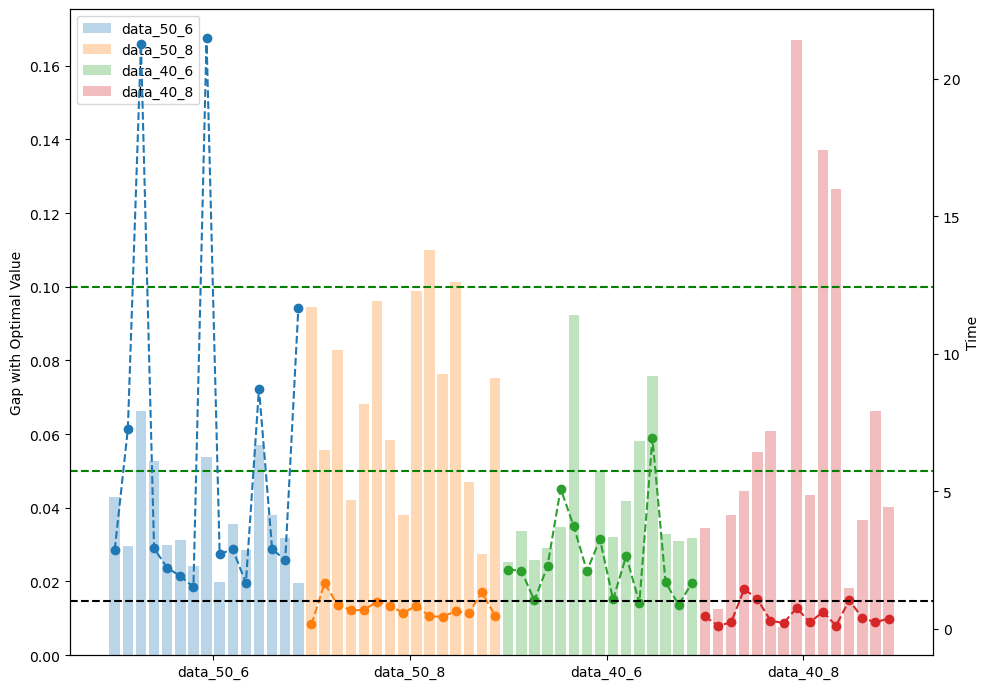

In [270]:
import numpy as np
import matplotlib.pyplot as plt

# 示例数据
num_datasets = 15
data = {
    'data_50_6': {'optimal_values': Gap_1_1_1[data_50_6], 'times': time_com_1_1_1[data_50_6]},
    'data_50_8': {'optimal_values': Gap_1_1_1[data_50_8], 'times': time_com_1_1_1[data_50_8]},
    'data_40_6': {'optimal_values': Gap_1_1_1[data_40_6], 'times': time_com_1_1_1[data_40_6]},
    'data_40_8': {'optimal_values': Gap_1_1_1[data_40_8], 'times': time_com_1_1_1[data_40_8]}
}

# 柔和的颜色组合
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

fig, ax1 = plt.subplots(figsize=(10, 7))

# 使用ax1绘制直方图
offsets = np.arange(0, num_datasets * len(data), num_datasets)
for idx, (category, values) in enumerate(data.items()):
    ax1.bar(offsets[idx] + np.arange(num_datasets), values['optimal_values'], color=colors[idx], label=category,alpha = 0.3)

ax1.set_ylabel('Gap with Optimal Value')
# ax1.set_title('Comparison of Optimal Value and Time')
ax1.legend(loc="upper left")
ax1.axhline(y=0.1, color='green', linestyle='--',label = '0.1 Gap')
ax1.axhline(y=0.05, color='green', linestyle='--',label = '0.05 Gap')

# 使用ax2绘制折线图
ax2 = ax1.twinx()
for idx, (category, values) in enumerate(data.items()):
    ax2.plot(offsets[idx] + np.arange(num_datasets), values['times'], color=colors[idx], marker='o', linestyle='--')

ax2.axhline(y=1, color='black', linestyle='--', label='Time=1 line')
# ax2.axhline(y=2, color='black', linestyle='--', label='Time=2 line')
# ax2.axhline(y=3, color='black', linestyle='--', label='Time=3 line')
ax2.set_ylabel('Time')
ax2.set_xticks(offsets + num_datasets / 2)  # 将x轴的刻度标签设置在每个类别的中间位置
ax2.set_xticklabels(data.keys())

plt.tight_layout()
plt.show()


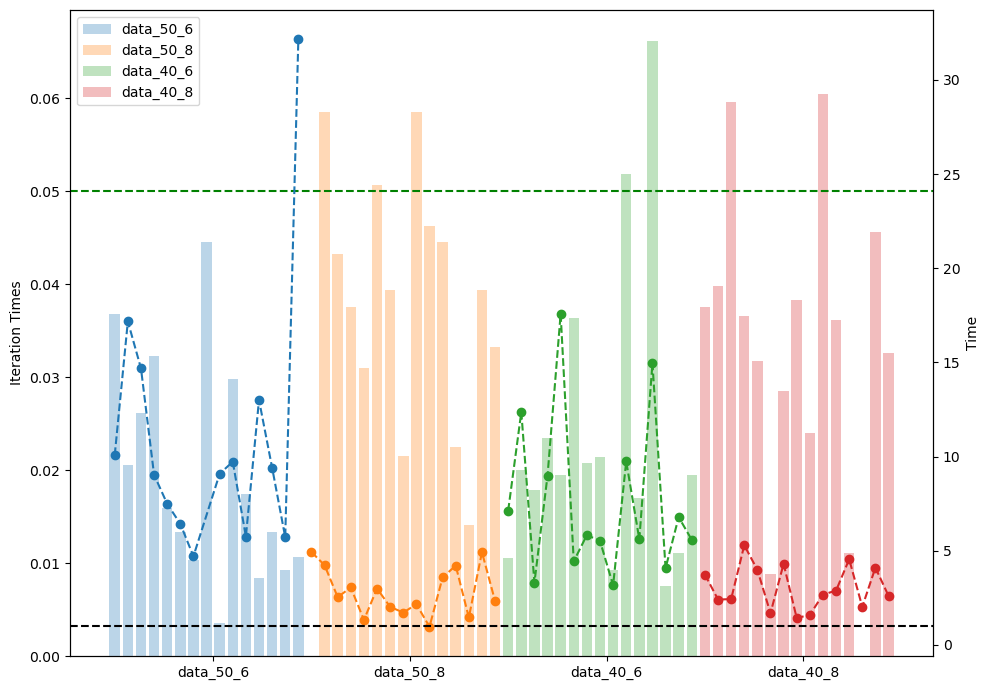

In [218]:
import numpy as np
import matplotlib.pyplot as plt

# 示例数据
num_datasets = 15
data = {
    'data_50_6': {'optimal_values': Gap_1_1_1[data_50_6], 'times': time_com_1_1_1[data_50_6]},
    'data_50_8': {'optimal_values': Gap_1_1_1[data_50_8], 'times': time_com_1_1_1[data_50_8]},
    'data_40_6': {'optimal_values': Gap_1_1_1[data_40_6], 'times': time_com_1_1_1[data_40_6]},
    'data_40_8': {'optimal_values': Gap_1_1_1[data_40_8], 'times': time_com_1_1_1[data_40_8]}
}

# 要排除的直方图最大值
all_optimal_values = np.concatenate([d['optimal_values'] for d in data.values()])
exclude_bar_indices = np.argsort(all_optimal_values)[-2:]

# 要排除的折线图最大值
all_times = np.concatenate([d['times'] for d in data.values()])
exclude_line_index = np.argmax(all_times)

# 柔和的颜色组合
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

fig, ax1 = plt.subplots(figsize=(10, 7))

# 使用ax1绘制直方图
offsets = np.arange(0, num_datasets * len(data), num_datasets)
for idx, (category, values) in enumerate(data.items()):
    x_vals = offsets[idx] + np.arange(num_datasets)
    y_vals = values['optimal_values']

    # 排除最大的两个数据
    mask = np.isin(x_vals, exclude_bar_indices, invert=True)
    ax1.bar(x_vals[mask], y_vals[mask], color=colors[idx], alpha=0.3, label=category)

ax1.set_ylabel('Iteration Times')
# ax1.set_title('Comparison of Optimal Value and Time')
ax1.legend(loc="upper left")
ax1.axhline(y=0.05, color='green', linestyle='--',label = '3 iterations')

# 使用ax2绘制折线图
ax2 = ax1.twinx()
for idx, (category, values) in enumerate(data.items()):
    x_values = offsets[idx] + np.arange(num_datasets)
    y_values = values['times']

    if exclude_line_index not in x_values:
        ax2.plot(x_values, y_values, color=colors[idx], linestyle='--', marker='o')
    else:
        valid_mask = x_values != exclude_line_index
        ax2.plot(x_values[valid_mask], y_values[valid_mask], color=colors[idx], linestyle='--', marker='o')

ax2.axhline(y=1, color='black', linestyle='--', label='Time=1 line')
ax2.set_ylabel('Time')
ax2.set_xticks(offsets + num_datasets / 2)  # 将x轴的刻度标签设置在每个类别的中间位置
ax2.set_xticklabels(data.keys())

plt.tight_layout()
plt.show()


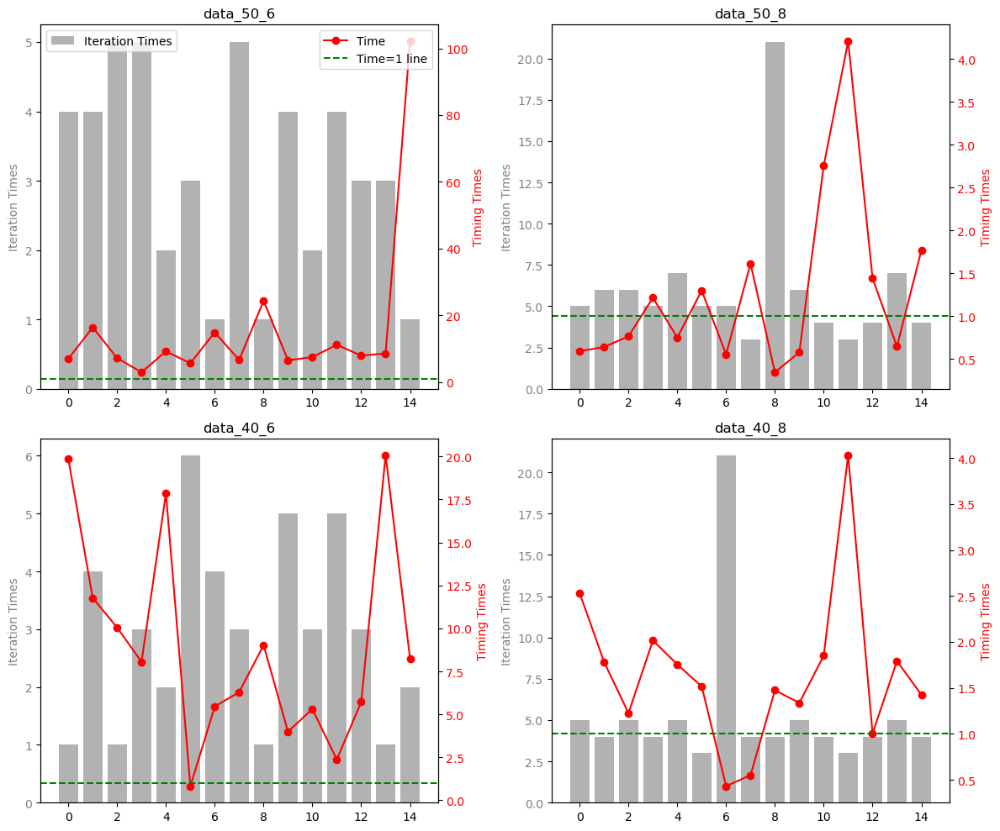

In [133]:
# Iteration 1 (Gap：2.5%)
df = pd.read_excel('Solve_1_1_1.xlsx', sheet_name='Sheet1', engine='openpyxl')
time_1_1_2 = df['time_1_1_1']
value_1_1_2 = df['value_1_1_1']
Rest_1_1_2 = df['Rest_1_1_1']
iteration_1_1_2 = df['iteration_1_1_1']

# Gap_1_1_1 = (value_1_1_2 - value_0)/value_0 

Gap_1_1_1 = iteration_1_1_2
# time_com_1_1_1 = time_0/time_1_1_2
time_com_1_1_1 = time_0/time_1_1_2
# 示例数据
categories = ['data_50_6', 'data_50_8', 'data_40_6', 'data_40_8']
data = {
    'data_50_6': {'optimal_values': Gap_1_1_1[data_50_6], 'times': time_com_1_1_1[data_50_6]},
    'data_50_8': {'optimal_values': Gap_1_1_1[data_50_8], 'times': time_com_1_1_1[data_50_8]},
    'data_40_6': {'optimal_values': Gap_1_1_1[data_40_6], 'times': time_com_1_1_1[data_40_6]},
    'data_40_8': {'optimal_values': Gap_1_1_1[data_40_8], 'times': time_com_1_1_1[data_40_8]}
}

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.ravel()

for i, category in enumerate(categories):
    ax1 = axs[i]
    ax2 = ax1.twinx()

    ax1.bar(range(15), data[category]['optimal_values'], color='grey', alpha=0.6, label='Iteration Times')
    ax1.set_ylabel('Iteration Times', color='grey')
    ax1.tick_params(axis='y', labelcolor='grey')
    ax1.set_title(category)
    
    ax2.plot(range(15), data[category]['times'], color='r', label='Time', marker='o')
    ax2.axhline(y=1, color='g', linestyle='--', label='Time=1 line')
    ax2.set_ylabel('Timing Times', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    if i == 0:  # 只为第一个图形添加图例
        ax1.legend(loc="upper left")
        ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()

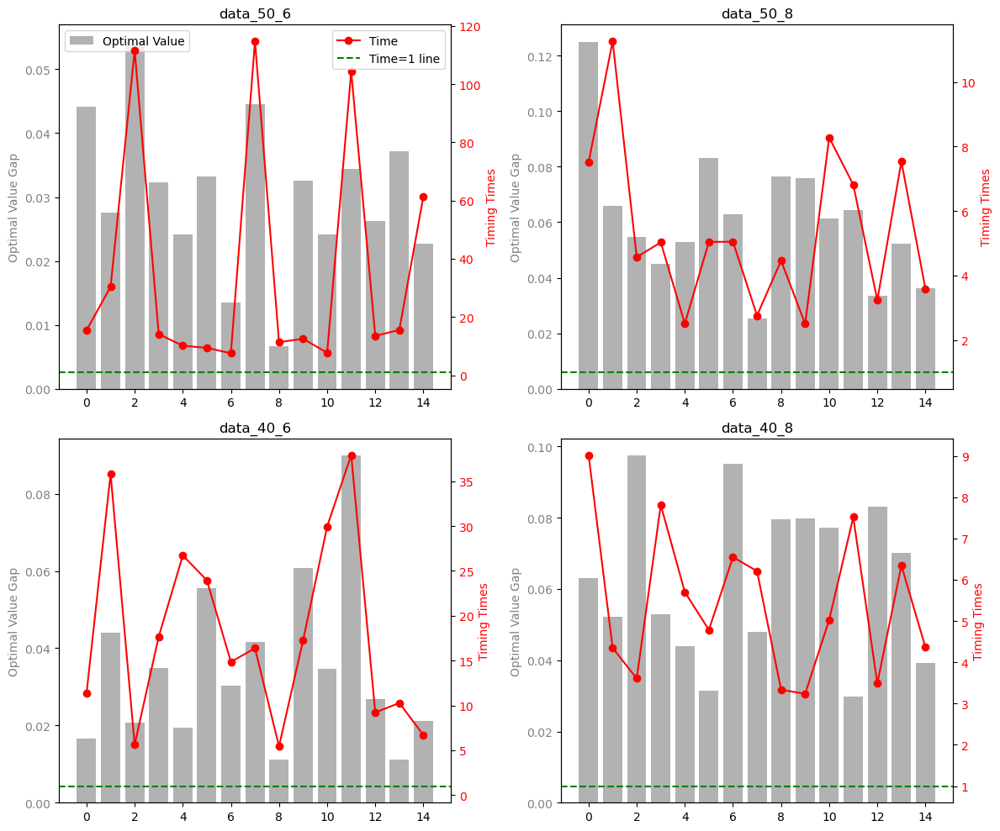

In [121]:
# 示例数据
categories = ['data_50_6', 'data_50_8', 'data_40_6', 'data_40_8']
data = {
    'data_50_6': {'optimal_values': Gap_1_1_1[data_50_6], 'times': time_com_1_1_1[data_50_6]},
    'data_50_8': {'optimal_values': Gap_1_1_1[data_50_8], 'times': time_com_1_1_1[data_50_8]},
    'data_40_6': {'optimal_values': Gap_1_1_1[data_40_6], 'times': time_com_1_1_1[data_40_6]},
    'data_40_8': {'optimal_values': Gap_1_1_1[data_40_8], 'times': time_com_1_1_1[data_40_8]}
}

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.ravel()

for i, category in enumerate(categories):
    ax1 = axs[i]
    ax2 = ax1.twinx()

    ax1.bar(range(15), data[category]['optimal_values'], color='grey', alpha=0.6, label='Optimal Value')
    ax1.set_ylabel('Optimal Value Gap', color='grey')
    ax1.tick_params(axis='y', labelcolor='grey')
    ax1.set_title(category)
    
    ax2.plot(range(15), data[category]['times'], color='r', label='Time', marker='o')
    ax2.axhline(y=1, color='g', linestyle='--', label='Time=1 line')
    ax2.set_ylabel('Timing Times', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    if i == 0:  # 只为第一个图形添加图例
        ax1.legend(loc="upper left")
        ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()


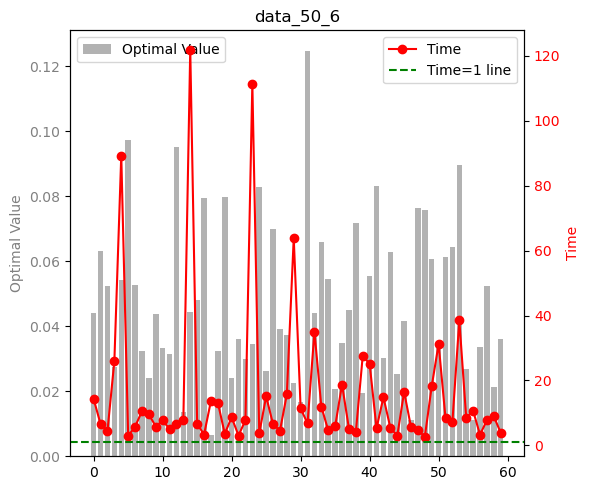

In [90]:
# 示例数据
data = {
    'optimal_values': Gap_1_1_1,
    'times': time_com_1_1_1
}

fig, ax1 = plt.subplots(figsize=(6, 5))

# 使用ax1绘制直方图
ax1.bar(range(60), data['optimal_values'], color='grey', alpha=0.6, label='Optimal Value')
ax1.set_ylabel('Optimal Value', color='grey')
ax1.tick_params(axis='y', labelcolor='grey')
ax1.set_title('data_50_6')

# 使用ax2绘制折线图
ax2 = ax1.twinx()
ax2.plot(range(60), data['times'], color='r', label='Time', marker='o')
ax2.axhline(y=1, color='g', linestyle='--', label='Time=1 line')
ax2.set_ylabel('Time', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# 添加图例
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()


## 4. Day Centers

### 4.1 Initialize
Calculate needed parameters, and solutions from week part

#### 4.1.1 Preparation 1: Get Result from Week Part

In [ ]:
# file_name = "Data_50_6_3_2.txt"
# time,value,iteration,S_x,S_g,S_u,Total_rest,centers,arrange = WeekCenter_IniandImp(file_name)

#### 4.1.2 Preparation 2: Initialize Parameters

In [ ]:
def Initialize_day(Parameters,BasicUnits,arrange):
    # calculate D
    # D = range(Parameters['Number of Days per Week'])
    # W = range(Parameters['Number of Weeks'])
    # B = range(Parameters['Number of BasicUnits'])
    
    # calculate phi: Week of Day d
    WeekNum = int(Parameters['Number of Weeks'])
    DayNum = int(Parameters['Number of Days per Week'])
    Alldays = WeekNum*DayNum
    D = range(Alldays)
    phi = np.zeros((Alldays))
    for i in range(WeekNum):
        for j in range(DayNum): 
            phi[i*DayNum+j] = i

    mu_days = []
    for i in range(int(Parameters['Number of Weeks'])):
        mu_days.append(np.mean(BasicUnits[arrange[i],3]*BasicUnits[arrange[i],5]))

    tau_day = 0.7

    return D,phi,mu_days,tau_day

### 4.2 Model

In [ ]:
# model only contains days
def Model_Days_Opt(B,W,P_b,n,t,c,psi,D,phi,mu_days,tau_day,x,u,g,arrange):

    prob_d = xp.problem(name='MPSTDP in Days')

    # --- define variables --- #
    y = np.array([xp.var(name = 'y_{0}_{1}'.format(d+1,b+1),vartype = xp.binary) 
                  for d in D for b in B], dtype = xp.npvar).reshape(len(D),len(B))
    
    h = np.array([xp.var(name = 'h_{0}_{1}_{2}'.format(w+1,b+1,d+1),vartype = xp.binary)
             for w in W for b in B for d in D],dtype = xp.npvar).reshape(len(W),len(B),len(D))
    
    v = np.array([xp.var(name = 'v_{0}_{1}_{2}'.format(d+1,i+1,b+1),vartype = xp.binary)
             for d in D for i in B for b in B],dtype = xp.npvar).reshape(len(D),len(B),len(B))

    prob_d.addVariable(y,h,v)

    # --- add constraints --- #
    # constraint 7: ensure visiting n_b times in visiting week!!!!
    # prob_d.addConstraint(xp.Sum(h[w,b,d] for d in D) == n[b]*xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in arrange[w] for w in W)
    for w in W:
        for b in arrange[w]:
            prob_d.addConstraint(xp.Sum(h[w,b,d] for d in range(w*3,w*3+3)) == n[b]*xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]))

    # constraint 8: Ensure that if we visit customer b at day d (week φ(d)), there is a corresponding day center
    # prob_d.addConstraint(xp.Sum(v[d,i,b] for i in B) == h[phi[d],b,d] for d in D for b in B)
    # for d in D:
    #     prob_d.addConstraint(xp.Sum(v[d,i,b] for i in B) == h[int(phi[d]),b,d] for b in arrange[w])
    for w in W:
        prob_d.addConstraint(xp.Sum(v[d,i,b] for i in B) == h[w,b,d] for d in range(w*3,w*3+3) for b in arrange[w])
    # prob_d.addConstraint(xp.Sum(v[d,i,b] for i in arrange[int(phi[d])]) == h[int(phi[d]),b,d] for d in D for b in arrange[int(phi[d])])
    
    # constraint 9:
    for w in W:
        prob_d.addConstraint(v[d,i,b] <= y[d,i] for b in arrange[w] for i in B for d in range(w*3,w*3+3))

    # constraint 10:
    prob_d.addConstraint(xp.Sum(y[d,b] for b in B) == 1 for d in D)

    # # constraint 11:
    # tau_day = 0.999
    # prob_d.addConstraint(xp.Sum(t[b]*h[int(phi[d]),b,d] for b in B) >= (1 - tau_day)*mu_days[int(phi[d])] for d in D)
    
    # constraint 12:
    # prob_d.addConstraint(xp.Sum(t[b]*h[int(phi[d]),b,d] for b in B) <= (1 + tau_day)*mu_days[int(phi[d])] for d in D)
    prob_d.addConstraint(xp.Sum(v[d,i,b] for i in B for b in B) >= 4 for d in D)
    # --- set objective function --- #
    # prob_d.setObjective(xp.Sum(c[i,b]*n[b]*v[d,i,b]*h[int(phi[d]),b,d] for b in B for i in B for d in D), sense = xp.minimize)
    prob_d.setObjective(xp.Sum(c[i,b]*n[b]*v[d,i,b] for b in B for i in B for d in D), sense = xp.minimize)

    return prob_d,y,h,v

In [ ]:
# model contains both weeks and days
def Model_WeekandDay(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups,D,phi,mu_days,tau_day,x,u,g,lam):
    prob_wd = xp.problem(name='MPSTDP in Weeks')

    # --- define variables --- #
    x = np.array([xp.var(name = 'x_{0}_{1}'.format(w+1,b+1),vartype = xp.binary) 
                  for w in W for b in B], dtype = xp.npvar).reshape(len(W),len(B))

    u = np.array([xp.var(name = 'u_{0}_{1}_{2}'.format(w+1,i+1,b+1))
             for w in W for i in B for b in B],dtype = xp.npvar).reshape(len(W),len(B),len(B))

    g = np.array([xp.var(name = 'g_{0}_{1}'.format(b+1,p+1),vartype = xp.binary)
             for b in B for p in P], dtype = xp.npvar).reshape(len(B),len(P))

    y = np.array([xp.var(name = 'y_{0}_{1}'.format(d+1,b+1),vartype = xp.binary) 
                  for d in D for b in B], dtype = xp.npvar).reshape(len(D),len(B))
    
    h = np.array([xp.var(name = 'h_{0}_{1}_{2}'.format(w+1,b+1,d+1))
             for w in W for b in B for d in D],dtype = xp.npvar).reshape(len(W),len(B),len(D))
    
    v = np.array([xp.var(name = 'v_{0}_{1}_{2}'.format(d+1,i+1,b+1))
             for d in D for i in B for b in B],dtype = xp.npvar).reshape(len(D),len(B),len(B))

    prob_wd.addVariable(x,u,g,y,h,v)

    # --- set objective function --- #!!!!!!
    prob_wd.setObjective(xp.Sum(c[i,b]*n[b]*u[w,i,b] for b in B for i in B for w in W)*lam +
                         (1-lam)*xp.Sum(c[i,b]*n[b]*v[d,i,b] for b in B for i in B for d in D), sense = xp.minimize)

    # --- add constraints --- #
    # constraint 1   every customer has an week centerd
    prob_wd.addConstraint(xp.Sum(g[b,p] for p in P_b[b]) == 1 for b in B)

    # constraint 2   if we visit b at week w, arrange a week center for b at week w
    prob_wd.addConstraint(xp.Sum(u[w,i,b] for i in B) == xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in B for w in W)
        
    # constraint 3   ensure what what we arrange is a week center
    prob_wd.addConstraint(u[w,i,b] <= x[w,i] for w in W for i in B for b in B)

    # constraint 4
    prob_wd.addConstraint(xp.Sum(x[w,b] for b in B) == 1 for w in W)

    # constraint 5
    prob_wd.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) >= (1-tau)*mu for w in W)

    # constraint 6
    prob_wd.addConstraint(xp.Sum(t[b]*g[b,p]*psi[p,w] for b in B for p in P_b[b]) <= (1+tau)*mu for w in W)

    # constraint 7: ensure visiting n_b times in visiting week
    prob_wd.addConstraint(xp.Sum(v[d,i,b] for d in D) == n[b]*xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in B for w in W)

    # constraint 8: 
    prob_wd.addConstraint(xp.Sum(v[d,i,b] for i in B) == h[phi[d],b,d] for b in B for d in D)

    # constraint 9:
    prob_wd.addConstraint(v[d,i,b] == y[d,i] for b in B for i in B for d in D)

    # constraint 10:
    prob_wd.addConstraint(xp.Sum(y[d,b] for b in B) == 1 for d in D)

    # constraint 11:
    prob_wd.addConstraint(xp.Sum(t[b]*h[phi[d],b,d] for b in B) >= (1 - tau_day)*mu_days[phi[d]] for d in D)

    # constraint 12:
    prob_wd.addConstraint(xp.Sum(t[b]*h[phi[d],b,d] for b in B) <= (1 + tau_day)*mu_days[phi[d]] for d in D)
    
    return prob_wd,x,u,g,y,h,v

In [ ]:
# model only contains days with heuristic
def Model_Days_Heu(B,W,P,P_b,n,t,c,psi,r_b,mu,tau,Groups,D,phi,mu_days,tau_day,x,u,g):
    prob_d = xp.problem(name='MPSTDP in Days')

    # --- define variables --- #
    y = np.array([xp.var(name = 'y_{0}_{1}'.format(d+1,b+1),vartype = xp.binary) 
                  for d in D for b in B], dtype = xp.npvar).reshape(len(D),len(B))
    
    h = np.array([xp.var(name = 'h_{0}_{1}_{2}'.format(w+1,b+1,d+1))
             for w in W for b in B for d in D],dtype = xp.npvar).reshape(len(W),len(B),len(D))
    
    v = np.array([xp.var(name = 'v_{0}_{1}_{2}'.format(d+1,i+1,b+1))
             for d in D for i in B for b in B],dtype = xp.npvar).reshape(len(D),len(B),len(B))

    prob_d.addVariable(y,h,v)

    # --- set objective function --- #
    prob_d.setObjective(xp.Sum(c[i,b]*n[b]*v[d,i,b] for b in B for i in B for d in D), sense = xp.minimize)

    # --- add constraints --- #
    # constraint 7: ensure visiting n_b times in visiting week
    prob_d.addConstraint(xp.Sum(v[d,i,b] for d in D) == n[b]*xp.Sum(g[b,p]*psi[p,w] for p in P_b[b]) for b in B for w in W)

    # constraint 8: 
    prob_d.addConstraint(xp.Sum(v[d,i,b] for i in B) == h[phi[d],b,d] for b in B for d in D)

    # constraint 9:
    prob_d.addConstraint(v[d,i,b] == y[d,i] for b in B for i in B for d in D)

    # constraint 10:
    prob_d.addConstraint(xp.Sum(y[d,b] for b in B) == 1 for d in D)

    # constraint 11:
    prob_d.addConstraint(xp.Sum(t[b]*h[phi[d],b,d] for b in B) >= (1 - tau_day)*mu_days[phi[d]] for d in D)

    # constraint 12:
    prob_d.addConstraint(xp.Sum(t[b]*h[phi[d],b,d] for b in B) <= (1 + tau_day)*mu_days[phi[d]] for d in D)

    # add heuristic results
    
    
    return prob_d,y,h,v

### 4.3 Solve Problem Optimaly

#### 4.3.1 Not Consider Week Centers Result

In [ ]:
# file_name = "Data_50_6_3_2.txt"
# Parameters,BasicUnits,SalesPersons = read_file('Data/'+file_name)
# B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)
# time,value,iteration,S_x,S_g,S_u,Total_rest,centers,arrange = WeekCenter_IniandImp(file_name)

#### 4.3.2 Consider Week Centers Result

In [ ]:
file_name = "Data_50_6_3_2.txt"
Parameters,BasicUnits,SalesPersons = read_file('Data/'+file_name)
B,W,P,P_b,n,t,c,psi,r_b,mu,tau = Initialize(Parameters,BasicUnits)
time,value,iteration,S_x,S_g,S_u,Total_rest,centers,arrange = WeekCenter_IniandImp(file_name)
# time,value,iteration,Total_rest,centers,arrange = WeekCenter_IniandImp2(file_name)
D,phi,mu_days,tau_day = Initialize_day(Parameters,BasicUnits,arrange)

In [ ]:
for i in range(6):
    print(arrange[i])

In [ ]:
prob_d,y,h,v = Model_Days_Opt(B,W,P_b,n,t,c,psi,D,phi,mu_days,tau_day,S_x,S_u,S_g,arrange)
prob_d.solve()
prob_d.write("example0", "lp")

In [ ]:
S_h = prob_d.getSolution(h) # w,b,d
S_v = prob_d.getSolution(v) # d,i,b
S_y = prob_d.getSolution(y) # d,b
time = []
for d in D:
    time1 = 0
    for b in B:
        time1 = time1 + t[b]*S_h[int(phi[d]),b,d]
    time.append(time1)
centers_day = []
for d in D:
    for b in B:
        if S_y[d,b] == 1:
            centers_day.append(b)
arrange_day = []
for d in D:
    arrange_unit = []
    for b in B:
        if S_v[d,centers_day[d],b] == 1:
            arrange_unit.append(b)
    arrange_day.append(arrange_unit)
print(prob_d.getObjVal())
for d in D:
    print(centers_day[d],',',round(time[d],3),',',arrange_day[d])


### 4.4 Solve Problem with Heuristic Solution

#### 4.4.1 Initialize a start Groups

In [ ]:
def IniGroup_Day(Parameters,BasicUnits,arrange):
    N = Parameters['Number of Days per Week']
    Times = BasicUnits[:,3]
    Groups_All = []

    for w in range(Parameters['Number of Weeks']):
        Select = np.argsort(Times[arrange[w]])[-N:]
        Rest = (np.delete(BasicUnits[arrange[w]:,0], Select) - 1).astype(int)
        
        Groups_day = []
        for d in range(N):
            Groups_day.aapend(Select[d])

        while len(Rest) > 0:
            centroids = []
            for cluster_id in range(N):
                cluster_points = BasicUnits[Groups_day[cluster_id],1:3]
                centroid = np.mean(cluster_points, axis=0)
                centroids.append(centroid)

            # calculate all groups' times
            Group_Sum_Times = []
            for i in range(N):
                sumption = np.sum(Times[Groups_day[i]])
                Group_Sum_Times.append(sumption)
            
            # find the smallest Group
            min_group = Group_Sum_Times.index(min(Group_Sum_Times))

            # calculate distance
            def euclidean_distance(point1, point2):
                return np.linalg.norm(point1 - point2)            

            # find which one to add in groups
            eva = -1
            for i in Rest:
                eva_compare = Times[i]/euclidean_distance(BasicUnits[i,1:3], centroids[min_group])
                if eva_compare > eva:
                    Add = i
                    eva = eva_compare
            
            # Add 1 more custoemr to the min_group
            Select = np.append(Select,Add)
            Rest = np.delete(Rest,Rest == Add)
            Groups_day[min_group].append(Add)
        
        Groups_All.append(Groups_day)
    
    return Groups_All


#### 4.4.2 Improve Groups